Imports + Open the Image

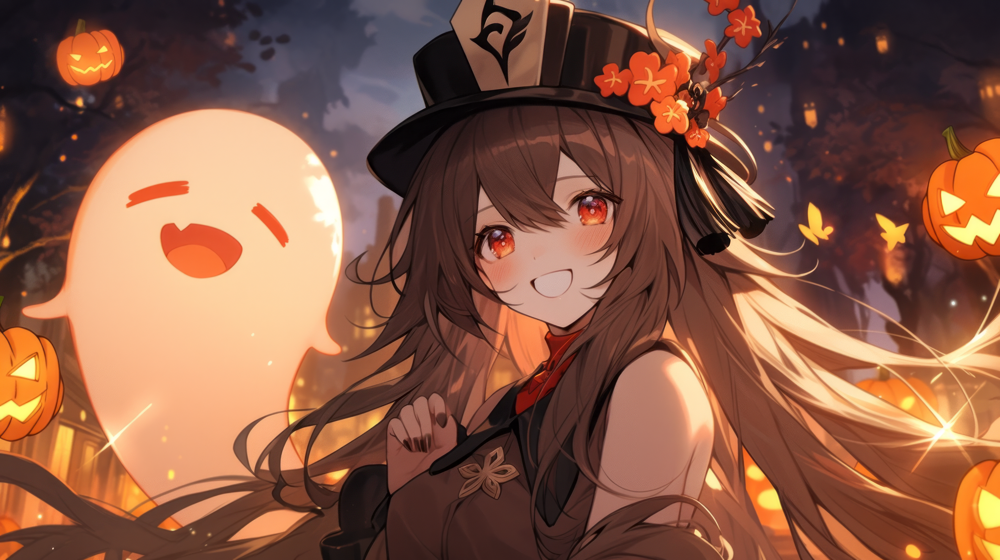

In [2]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import requests
from io import BytesIO

# CS Club Logo
#response = requests.get("https://github.com/BaroqueObama/hhs-ws-convolutions/blob/main/images/cs-club-logo-small.png?raw=true")

# Other Images
# CS Club Logo High Res (Not Recommend): cs-club-logo.png
#response = requests.get("https://github.com/BaroqueObama/hhs-ws-convolutions/blob/main/images/cs-club-logo.png?raw=true")

# Mr Incredible: mr-incredible.png
#response = requests.get("https://github.com/BaroqueObama/hhs-ws-convolutions/blob/main/images/mr-incredible.png?raw=true")

# Halloween Doge: halloween-shiba.png
#response = requests.get("https://github.com/BaroqueObama/hhs-ws-convolutions/blob/main/images/halloween-shiba.png?raw=true")

# Backend Developer: halloween-backend-dev.png
#response = requests.get("https://github.com/BaroqueObama/hhs-ws-convolutions/blob/main/images/halloween-backend-dev.png?raw=true")

# Recommend for Edge Detection
# Anime Girl: genshit.png
response = requests.get("https://github.com/BaroqueObama/hhs-ws-convolutions/blob/main/images/genshit.png?raw=true")


# read the image
pic = Image.open(BytesIO(response.content))

# display the image
# Note: normally you would like do pic.show() but google colab is a little weird so just doing pic shows it
pic

Convert the image to grayscale

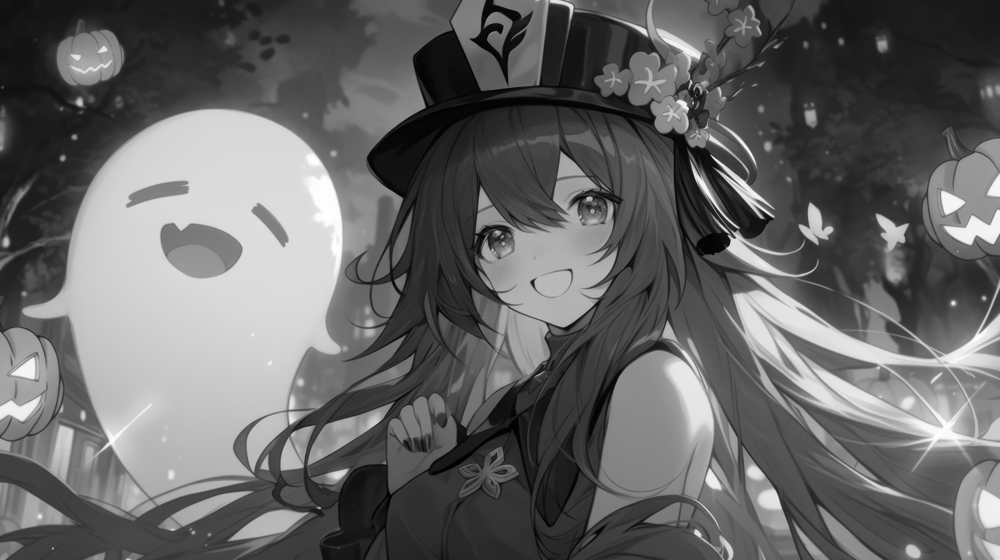

In [3]:
# convert the image to grayscale
image = pic.convert('L')

# display
image

Convert the image to an array

In [4]:
# conver the grayscale image to an array
array = np.array(image)

# display it
print(array)

# print some stats that our useful for us
print(type(array)) # class/type
print(array.shape) # size

[[ 21  22  21 ...  24  22  24]
 [ 21  20  22 ...  23  22  22]
 [ 21  22  20 ...  22  22  23]
 ...
 [144 143 143 ... 223 223 224]
 [146 146 146 ... 222 224 223]
 [148 146 147 ... 224 224 224]]
<class 'numpy.ndarray'>
(1224, 2184)


Make a 3x3 Kernel

In [37]:
# make our 3x3 blurring kernel (np.ndarray)
kernel = np.array([[0, -1, 0],
                   [-1, 5, -1],
                   [0, -1, 0]]) * 1
# Once you've done blurring, find out how to sharpen, or do edge detection!

# display it
print(kernel)

[[ 0 -1  0]
 [-1  5 -1]
 [ 0 -1  0]]


Run our kernel over our image

Note: this is completely unoptimized and this is not what a fast fourier transform does, the point of what i'm doing here is just for simplicities sake and readability

In [38]:
# our new_array object is what the kernel is being applied to
new_array = np.empty((array.shape[0], array.shape[1]))

for i in range (0, array.shape[0] - len(kernel)):
  for j in range (0, array.shape[1] - len(kernel[0])):
    # math is laid out here for you guys to see, but what would be quicker would be to research the np.convolve methods
    # new_array = ndimage.convolve(array, kernel)
    new_array[i][j] = (kernel[0][0] * array[i][j] + kernel[0][1] * array[i][j+1] + kernel[0][2] * array[i][j+2] + \
                       kernel[1][0] * array[i+1][j] + kernel[1][1] * array[i+1][j+1] + kernel[1][2] * array[i+1][j+2] + \
                       kernel[2][0] * array[i+2][j] + kernel[2][1] * array[i+2][j+1] + kernel[2][2] * array[i+2][j+2])
    # print(new_array[i][j])

print(new_array[50, 100]) # example value

20.0


### Only run this cell for edge detection. Makes image easier to see. (Click to Reveal code)

In [34]:
new_array = new_array * 2
new_array = new_array + 100

### Convert back to an image now

In [39]:
new_image = Image.fromarray(new_array)

Display the images side by side to see how they compare, notice how new_image is blurry

Why does new_image have that little black outline? - This is some food for thought, but I recommend doing the other activities first.

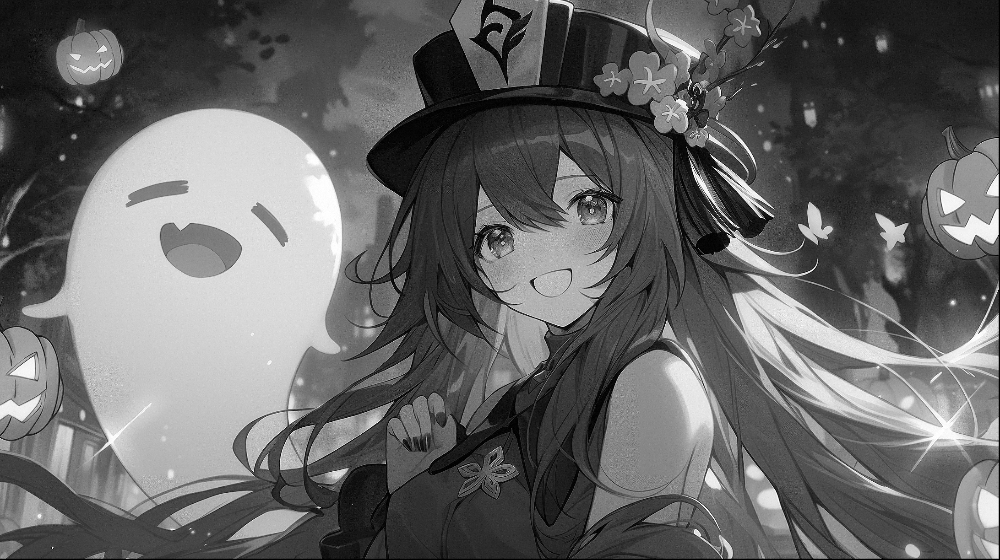

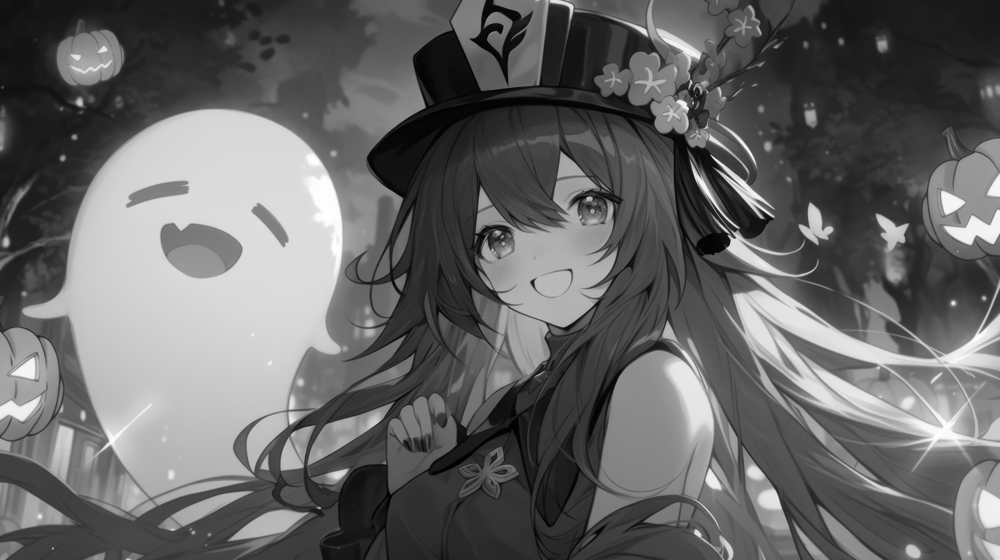

In [40]:
new_image = new_image.convert("L")

display(new_image, image)

## Possible Activities to do/extend your understanding (in order of what I recommend)

1. Try to add new images and mess around with different kernels, especially what edge detection kernels are. Look up this or look at the video we presented (that one is a really good resource).

2. Try to figure out how to use some already made methods for this. Look at this link for scikit.convolve2d: https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.convolve2d.html. Look at some other links np.fttconvolve (i think) for a fast fourier transform convolution.

3. This is a pretty cool tutorial on how to deepfry images with 2d convolutions. https://medium.com/analytics-vidhya/2d-convolution-using-python-numpy-43442ff5f381. Look at it if you're interested for other deep-frying of images. It has strides and padding which are important things we taught with convolutions.

4. Read into how fast fourier transforms work for their math.

## Resources used for the presentation

1. 3Blue1Brown Video: https://www.youtube.com/watch?v=KuXjwB4LzSA

2. Convolutions simply explained with pooling (if you prefer text): https://towardsdatascience.com/understanding-convolutions-and-pooling-in-neural-networks-a-simple-explanation-885a2d78f211

3. Fast Fourier Transforms simply explained: just read the medium 3 part series or look at 3Blue1Brown's video/Veritasium's video
Note for FFT's: If you haven't taken Calculus yet, I would just save it for later because you aren't going to understand the complicated math :(

In [ ]:
for i in range (0, array.shape[0]):
  for j in range (0, array.shape[1]):
    #print(new_array[i][j])
    if (new_array[i][j] > 0):
      new_array[i][j] = 255
    # print(new_array[i][j])

new_image = Image.fromarray(new_array)

new_image = new_image.convert("L")

display(new_image, image)

IndentationError: ignored